In [2]:
#Import packages
import xarray as xr
import pandas as pd
import numpy as np
import datetime as dt
import s3fs
import geocat.comp
from datetime import datetime
import dask
import zarr
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import netCDF4
import os
import proplot as pplt
import warnings
import cartopy.crs as crs
import cartopy.feature as cfeature
from numpy import meshgrid, deg2rad, gradient, cos, sin
from xarray import DataArray
from scipy import stats
from sklearn.preprocessing import StandardScaler as scale
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from scipy.interpolate import griddata
import xesmf as xe
from sklearn import preprocessing
warnings.filterwarnings('ignore')

In [20]:
#Load in ERA5 data
download_path='/home/jupyter-dipti/work/processed/'
targetpath='isosph5.nonorm.ERA5_Exp8_Output.nc'
targetfile=download_path+targetpath
targetdata=xr.open_dataset(targetfile)


In [18]:
#Big el nino years
elninostart1='2015-09-01'
elninoend1='2016-03-01'

elninostart2='1982-10-01'
elninoend2='1983-03-01'

elninostart3='1997-09-01'
elninoend3='1998-02-01'

In [25]:
#Slice times and concatenate arrays
targetelnino1=targetdata.sel(time=slice(elninostart1,elninoend1))
targetelnino2=targetdata.sel(time=slice(elninostart2,elninoend2))
targetelnino3=targetdata.sel(time=slice(elninostart3,elninoend3))


elninotarget=xr.concat([targetelnino2,targetelnino3,targetelnino1],dim='time')

In [28]:
#Load in target data
tas_target=elninotarget.tas_nonorm
pr_target=elninotarget.pr_nonorm
ps_target=elninotarget.ps_nonorm

lon=elninotarget.lon
lat=elninotarget.lat

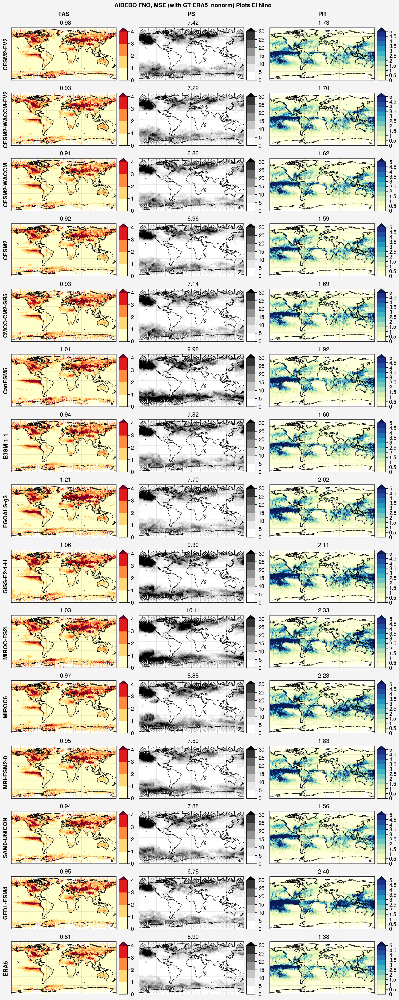

In [36]:
rgionList=[[-30,30],[30,60],[60,90],[-60,-30],[-90,-60]]
#Specify Model Names
hmDataTas=[]
hmDataPs=[]
hmDataPr=[]
dataPath='/home/jupyter-dipti/work/AiBEDO_simultaneousPreds_Salva/Data/ckpoints/'
modelNames=[x for x in os.listdir(dataPath) if not x.startswith('.')]

fig,axes=pplt.subplots(nrows=15,ncols=3,proj=crs.PlateCarree())
for i,name in enumerate(modelNames):
    download_path='/home/jupyter-dipti/work/AiBEDO_simultaneousPreds_Salva/Data/ERA5_Preds_nonorm_FNO_simul/'

    files=file=download_path+'FNO_trained_on_'+name+'_era5_nonormPred.nc' #'FNO_trained_on_'+name+'_era5_nonormPred.nc'
    data=xr.open_dataset(files)
    
        
    #Select el nino years 
    elnino1=data.sel(time=slice(elninostart1,elninoend1))
    elnino2=data.sel(time=slice(elninostart2,elninoend2))
    elnino3=data.sel(time=slice(elninostart3,elninoend3))
    
    data=xr.concat([elnino2,elnino3,elnino1],dim='time')
    
    
    tas_preds_data=tas_target.copy() ## just for copying coords
    tas_preds_data.values=data.pred_tas_nonorm.values
    
    tas_preds_Act=tas_preds_data
    
    tas_preds=tas_preds_Act.copy() ## for copying coordinates
    tas_preds.values=(tas_preds_Act.values-tas_target.values)**2
    
    tas_preds_timemean=tas_preds.mean(dim='time')
    #print(tas_preds_timemean)
    
    tas=[]
    for reg in rgionList:
        tas.append(tas_preds_timemean.where((tas_preds_timemean.lat>reg[0]) & (tas_preds_timemean.lat<=reg[1]),drop=True).mean().values[()])
    #print(tas)
    hmDataTas.append(tas)   
    
    
    con=axes[i,0].scatter(x=lon,y=lat,c=tas_preds_timemean,extend='max',cmap='YlOrRd',s=2, transform = crs.PlateCarree(),levels=np.arange(0.0,5.0,1))
    axes[i,0].colorbar(con, loc='r')
    axes[i,0].set_title(  "  {:0.2f}".format(tas_preds_timemean.mean().values))
    
    ps_preds_data=ps_target.copy() ## just for copying coords
    ps_preds_data.values=data.pred_ps_nonorm.values
    
    ps_preds_Act=ps_preds_data
    
    ps_preds=ps_preds_Act.copy() ## for copying coordinates
    ps_preds.values=(ps_preds_Act.values-ps_target.values)**2
    
    ps_preds_timemean=ps_preds.mean(dim='time')
    
    
    ps=[]
    for reg in rgionList:
        ps.append(ps_preds_timemean.where((ps_preds_timemean.lat>reg[0]) & (ps_preds_timemean.lat<=reg[1]),drop=True).mean().values)
    hmDataPs.append(ps)
    
    con=axes[i,1].scatter(x=lon,y=lat,c=ps_preds_timemean,extend='max',cmap='Greys',s=2, transform = crs.PlateCarree(),levels=np.arange(0,35,5))
    axes[i,1].colorbar(con, loc='r')
    axes[i,1].set_title(  "  {:0.2f}".format(ps_preds_timemean.mean().values))
    
    
    pr_preds_data=pr_target.copy() ## just for copying coords
    pr_preds_data.values=data.pred_pr_nonorm.values
    
    pr_preds_Act=pr_preds_data
    
    pr_preds=pr_preds_Act.copy() ## for copying coordinates
    pr_preds.values=(pr_preds_Act.values-pr_target.values)**2
    
    pr_preds_timemean=pr_preds.mean(dim='time')
    
    pr=[]
    for reg in rgionList:
        pr.append(pr_preds_timemean.where((pr_preds_timemean.lat>reg[0]) & (pr_preds_timemean.lat<=reg[1]),drop=True).mean().values)
    hmDataPr.append(pr)
    
    con=axes[i,2].scatter(x=lon,y=lat,c=pr_preds_timemean,extend='max',cmap='YlGnBu',s=2, transform = crs.PlateCarree(),levels=np.arange(0,5.5,0.5))
    axes[i,2].colorbar(con, loc='r')
    axes[i,2].set_title(  "  {:0.2f}".format(pr_preds_timemean.mean().values))
    

    
fig.format(coast=True)
axes.format(
        suptitle='AiBEDO FNO, MSE (with GT ERA5_nonorm) Plots El Nino',
        toplabels=('TAS', 'PS','PR'),
        leftlabels=modelNames#['CESM2','3ESMs','CESM2_MLP','3ESMs_MLP']#modelNames#[modelNames[0:2],modelNames[0:2]
           )
#axes.format(suptitle='AiBEDO Trained on Model Surface Temperature climatology Plots 1975-2005')
#cbar=plt.colorbar(con)
#cbar.set_label('Temp. MSE $(K)^2$')
#fig.save('ERA5_nonormMSE_FNO.png')


In [39]:
#Big La nina years
laninastart1='1973-10-01'
laninaend1='1974-02-01'

laninastart2='1999-10-01'
laninaend2='2000-02-01'

laninastart3='1988-09-01'
laninaend3='1989-02-01'

In [42]:
#Slice times and concatenate arrays
lanina1=targetdata.sel(time=slice(laninastart1,laninaend1))
lanina2=targetdata.sel(time=slice(laninastart2,laninaend2))
lanina3=targetdata.sel(time=slice(laninastart3,laninaend3))


laninatarget=xr.concat([lanina1,lanina3,lanina2],dim='time') 

In [43]:
#Load in target data
tas_target=laninatarget.tas_nonorm
pr_target=laninatarget.pr_nonorm
ps_target=laninatarget.ps_nonorm

lon=laninatarget.lon
lat=laninatarget.lat

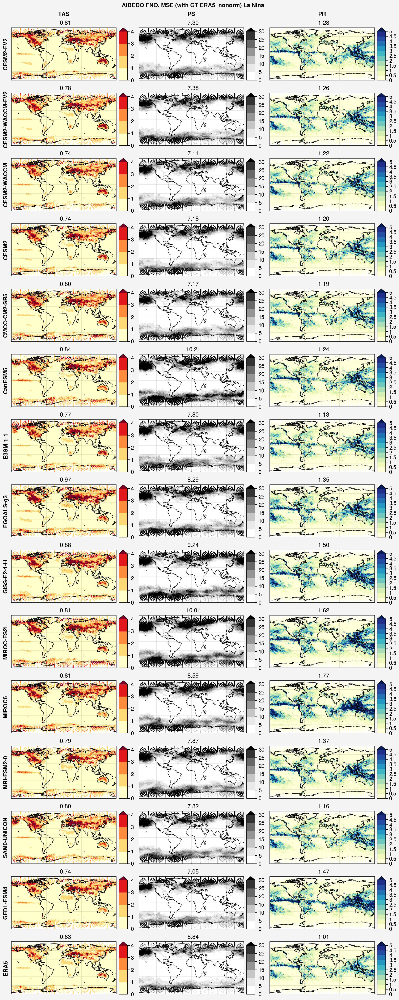

In [44]:
rgionList=[[-30,30],[30,60],[60,90],[-60,-30],[-90,-60]]
#Specify Model Names
hmDataTas=[]
hmDataPs=[]
hmDataPr=[]
dataPath='/home/jupyter-dipti/work/AiBEDO_simultaneousPreds_Salva/Data/ckpoints/'
modelNames=[x for x in os.listdir(dataPath) if not x.startswith('.')]

fig,axes=pplt.subplots(nrows=15,ncols=3,proj=crs.PlateCarree())
for i,name in enumerate(modelNames):
    download_path='/home/jupyter-dipti/work/AiBEDO_simultaneousPreds_Salva/Data/ERA5_Preds_nonorm_FNO_simul/'

    files=file=download_path+'FNO_trained_on_'+name+'_era5_nonormPred.nc' #'FNO_trained_on_'+name+'_era5_nonormPred.nc'
    data=xr.open_dataset(files)
    
        
    #Select el nino years 
    lanina1=data.sel(time=slice(laninastart1,laninaend1))
    lanina2=data.sel(time=slice(laninastart2,laninaend2))
    lanina3=data.sel(time=slice(laninastart3,laninaend3))
    
    data=xr.concat([lanina1,lanina3,lanina2],dim='time')
    
    
    tas_preds_data=tas_target.copy() ## just for copying coords
    tas_preds_data.values=data.pred_tas_nonorm.values
    
    tas_preds_Act=tas_preds_data
    
    tas_preds=tas_preds_Act.copy() ## for copying coordinates
    tas_preds.values=(tas_preds_Act.values-tas_target.values)**2
    
    tas_preds_timemean=tas_preds.mean(dim='time')
    #print(tas_preds_timemean)
    
    tas=[]
    for reg in rgionList:
        tas.append(tas_preds_timemean.where((tas_preds_timemean.lat>reg[0]) & (tas_preds_timemean.lat<=reg[1]),drop=True).mean().values[()])
    #print(tas)
    hmDataTas.append(tas)   
    
    
    con=axes[i,0].scatter(x=lon,y=lat,c=tas_preds_timemean,extend='max',cmap='YlOrRd',s=2, transform = crs.PlateCarree(),levels=np.arange(0.0,5.0,1))
    axes[i,0].colorbar(con, loc='r')
    axes[i,0].set_title(  "  {:0.2f}".format(tas_preds_timemean.mean().values))
    
    ps_preds_data=ps_target.copy() ## just for copying coords
    ps_preds_data.values=data.pred_ps_nonorm.values
    
    ps_preds_Act=ps_preds_data
    
    ps_preds=ps_preds_Act.copy() ## for copying coordinates
    ps_preds.values=(ps_preds_Act.values-ps_target.values)**2
    
    ps_preds_timemean=ps_preds.mean(dim='time')
    
    
    ps=[]
    for reg in rgionList:
        ps.append(ps_preds_timemean.where((ps_preds_timemean.lat>reg[0]) & (ps_preds_timemean.lat<=reg[1]),drop=True).mean().values)
    hmDataPs.append(ps)
    
    con=axes[i,1].scatter(x=lon,y=lat,c=ps_preds_timemean,extend='max',cmap='Greys',s=2, transform = crs.PlateCarree(),levels=np.arange(0,35,5))
    axes[i,1].colorbar(con, loc='r')
    axes[i,1].set_title(  "  {:0.2f}".format(ps_preds_timemean.mean().values))
    
    
    pr_preds_data=pr_target.copy() ## just for copying coords
    pr_preds_data.values=data.pred_pr_nonorm.values
    
    pr_preds_Act=pr_preds_data
    
    pr_preds=pr_preds_Act.copy() ## for copying coordinates
    pr_preds.values=(pr_preds_Act.values-pr_target.values)**2
    
    pr_preds_timemean=pr_preds.mean(dim='time')
    
    pr=[]
    for reg in rgionList:
        pr.append(pr_preds_timemean.where((pr_preds_timemean.lat>reg[0]) & (pr_preds_timemean.lat<=reg[1]),drop=True).mean().values)
    hmDataPr.append(pr)
    
    con=axes[i,2].scatter(x=lon,y=lat,c=pr_preds_timemean,extend='max',cmap='YlGnBu',s=2, transform = crs.PlateCarree(),levels=np.arange(0,5.5,0.5))
    axes[i,2].colorbar(con, loc='r')
    axes[i,2].set_title(  "  {:0.2f}".format(pr_preds_timemean.mean().values))
    

    
fig.format(coast=True)
axes.format(
        suptitle='AiBEDO FNO, MSE (with GT ERA5_nonorm) La Nina',
        toplabels=('TAS', 'PS','PR'),
        leftlabels=modelNames#['CESM2','3ESMs','CESM2_MLP','3ESMs_MLP']#modelNames#[modelNames[0:2],modelNames[0:2]
           )
#axes.format(suptitle='AiBEDO Trained on Model Surface Temperature climatology Plots 1975-2005')
#cbar=plt.colorbar(con)
#cbar.set_label('Temp. MSE $(K)^2$')
#fig.save('ERA5_nonormMSE_FNO.png')
